# Government720 Noisy Extrapolation
This is extrapolating the data using noisy data.

### CLIENT 1

In [1]:
# Import pandas
import pandas as pd

# Access Google Drive for Excel file
from google.colab import drive
drive.mount('/content/drive')

# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT1_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

Mounted at /content/drive
   UNEMPLOYMENT_RATE  INFLATION_RATE       GDP  HOUSING_AFFORD  MIN_WAGE  \
0                NaN        0.428571  0.000000             NaN  0.000000   
1                NaN        0.439460 -0.006451             NaN -0.015130   
2                NaN        0.461814  0.020851             NaN  0.002986   
3                NaN        0.466160  0.023599             NaN -0.012395   
4                NaN        0.473214 -0.014477             NaN -0.006515   

   POVERTY_WAGE  GENDER_GAP  RACIAL_GAP  DEFICIT  SS_RECIPIENTS  ...  \
0      0.000000    1.000000    0.000000      NaN       0.000000  ...   
1      0.012035    1.012380    0.015080      NaN      -0.012662  ...   
2     -0.003704    1.000877    0.012387      NaN      -0.001014  ...   
3     -0.024910    0.995282    0.023790      NaN      -0.011743  ...   
4      0.009105    1.000385    0.021138      NaN      -0.002070  ...   

   PAYROLL_TAX  CORPORATE_TAX  CORPORATE_PROFIT  TOP1_WEALTH  FICO_SCORE  \
0     0.

In [11]:
# Import packages
import numpy as np
from scipy.optimize import curve_fit

# Define function to extrapolate using sinusoidal fitting of known values with 0.01 noise
def extrapolate_column(x_index, y_values, noise_level=0.01):
    # Remove NaN values for fitting
    mask = ~np.isnan(y_values)
    x_known = x_index[mask]
    y_known = y_values[mask]

    # Define a general sinusoidal function: A * sin(B * x + C) + D
    def sin_func(x, A, B, C, D):
        return A * np.sin(B * x + C) + D

    # Improved initial parameter guess: (A, B, C, D)
    A_guess = (np.max(y_known) - np.min(y_known)) / 2  # Amplitude
    B_guess = 2 * np.pi / (x_known[-1] - x_known[0])   # Frequency (1 cycle over known range)
    C_guess = 0                                         # Phase shift
    D_guess = np.mean(y_known)                          # Vertical shift

    # Handle cases where data might not have a clear sinusoidal pattern
    if np.std(y_known) < 1e-5:  # If the data is nearly constant
        B_guess = 0  # Frequency becomes 0 if the data is constant

    # Increase maxfev to give more iterations for convergence
    popt, _ = curve_fit(sin_func, x_known, y_known, p0=[A_guess, B_guess, C_guess, D_guess], maxfev=30000)

    # Predict missing head and tail using the fitted function
    x_head = x_index[: np.where(mask)[0][0]]  # Indices before first known value
    x_tail = x_index[np.where(mask)[0][-1] + 1 :]  # Indices after last known value

    y_head = sin_func(x_head, *popt) if len(x_head) > 0 else np.array([])
    y_tail = sin_func(x_tail, *popt) if len(x_tail) > 0 else np.array([])

    # Add Gaussian noise
    y_head += noise_level * np.random.randn(len(y_head))
    y_tail += noise_level * np.random.randn(len(y_tail))

    # Merge results
    y_full = y_values.copy()
    y_full[np.where(np.isnan(y_values))] = np.concatenate([y_head, y_tail])

    return y_full

In [ ]:
# Apply the function to each column in your DataFrame
df_extrapolated = df.copy()

for col in df.columns:
    df_extrapolated[col] = extrapolate_column(df.index.values, df[col].values)

print(df_extrapolated)

      UNEMPLOYMENT_RATE  INFLATION_RATE       GDP  HOUSING_AFFORD  MIN_WAGE  \
0              0.090771        0.428571  0.000000        0.564941  0.000000   
1              0.088336        0.439460 -0.006451        0.582133 -0.015130   
2              0.068309        0.461814  0.020851        0.557502  0.002986   
3              0.094006        0.466160  0.023599        0.569352 -0.012395   
4              0.080713        0.473214 -0.014477        0.578737 -0.006515   
...                 ...             ...       ...             ...       ...   
1295           0.061404        0.446429  0.992084        0.553803  0.721304   
1296           0.068841        0.484023  1.003965        0.561947  0.723718   
1297           0.056386        0.491619  0.979914        0.555939  0.706159   
1298           0.047830        0.509606  0.975679        0.554174  0.699791   
1299           0.052632        0.478285  0.994525        0.546731  0.717773   

      POVERTY_WAGE  GENDER_GAP  RACIAL_GAP   DEFICI

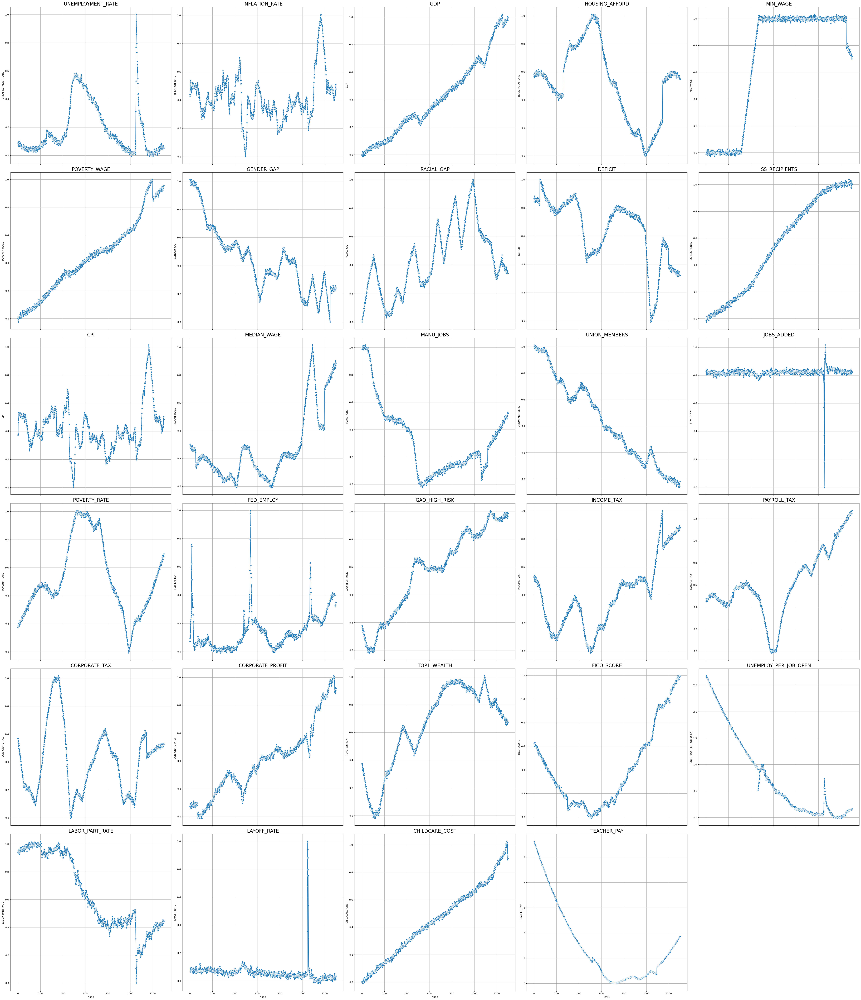

In [ ]:
# Make multi-graph chart of scaled time series variables to verify interpolation method is good
# Import packages
import seaborn as sns
import matplotlib.pyplot as plt

# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 2*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

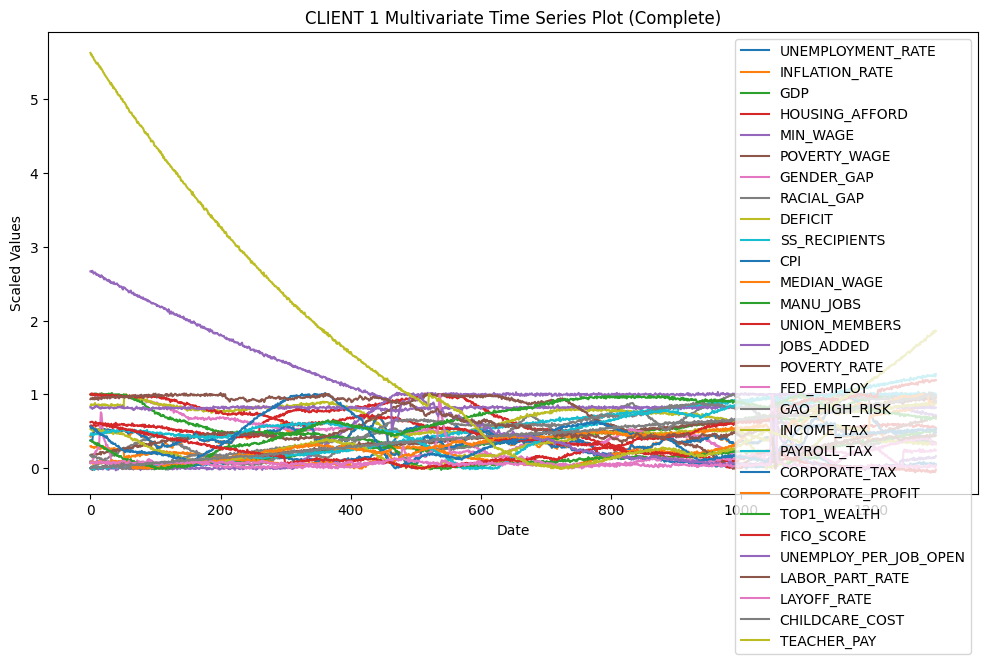

In [ ]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in df_extrapolated.columns:
    plt.plot(df_extrapolated.index, df_extrapolated[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 1 Multivariate Time Series Plot (Complete)")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [ ]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT1_Noisy_Extrapolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT1_Noisy_Extrapolated.xlsx


### CLIENT 2

In [ ]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT2_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   MEDIA_TRUST  FACEBOOK_USE  INSTAGRAM_USE  TWITTER_USE  FACT_CHECKERS  \
0     1.000000           NaN            NaN          NaN            NaN   
1     1.000805           NaN            NaN          NaN            NaN   
2     0.980042           NaN            NaN          NaN            NaN   
3     0.981156           NaN            NaN          NaN            NaN   
4     0.994488           NaN            NaN          NaN            NaN   

   MISINFORMATION_MENTIONS  
0                      NaN  
1                      NaN  
2                      NaN  
3                      NaN  
4                      NaN  


In [ ]:
# Apply the function to each column in your DataFrame
df_extrapolated = df.copy()

for col in df.columns:
    df_extrapolated[col] = extrapolate_column(df.index.values, df[col].values)

print(df_extrapolated)

      MEDIA_TRUST  FACEBOOK_USE  INSTAGRAM_USE  TWITTER_USE  FACT_CHECKERS  \
0        1.000000     -4.309157      -2.678125    -5.812023       0.002739   
1        1.000805     -4.305293      -2.665206    -5.798387      -0.001500   
2        0.980042     -4.287878      -2.672947    -5.783692      -0.014953   
3        0.981156     -4.274124      -2.650962    -5.777694       0.010507   
4        0.994488     -4.264574      -2.674281    -5.751633      -0.006282   
...           ...           ...            ...          ...            ...   
1295     0.000853      0.568702       0.969629     0.429243       0.803126   
1296    -0.004781      0.565058       0.947383     0.417321       0.804328   
1297     0.023673      0.553592       0.954869     0.411711       0.821219   
1298    -0.002152      0.557400       0.952674     0.412240       0.789999   
1299     0.000000      0.569247       0.966717     0.420363       0.788685   

      MISINFORMATION_MENTIONS  
0                   -0.020306  

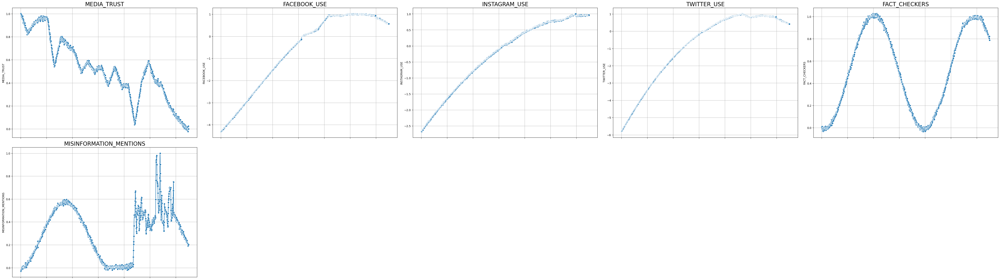

In [ ]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

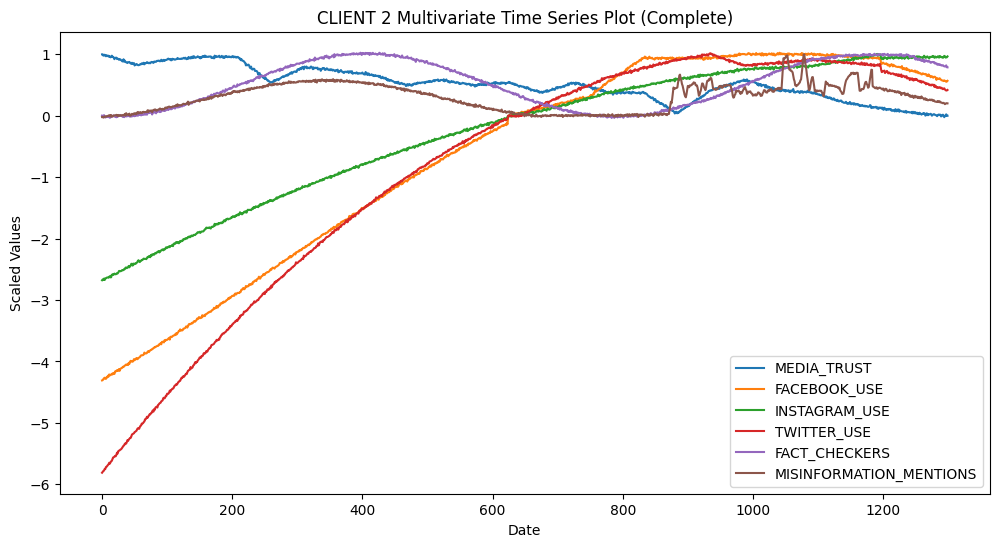

In [ ]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in df_extrapolated.columns:
    plt.plot(df_extrapolated.index, df_extrapolated[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 2 Multivariate Time Series Plot (Complete)")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [ ]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT2_Noisy_Extrapolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT2_Noisy_Extrapolated.xlsx


### CLIENT 3

In [45]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT3_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df)

      GUN_DEATH_RATE  OVERDOSE_DEATH_RATE  HEALTH_INSURANCE   SUICIDE  \
0           0.065217             0.000000          0.380952  0.000000   
1           0.090339             0.009411          0.391167 -0.014257   
2           0.058582            -0.003475          0.392390  0.001535   
3           0.078690             0.002548          0.383615  0.012880   
4           0.078848             0.003193          0.389130  0.011458   
...              ...                  ...               ...       ...   
1244        0.829501                  NaN               NaN       NaN   
1245        0.840526                  NaN               NaN       NaN   
1246        0.836288                  NaN               NaN       NaN   
1247        0.816141                  NaN               NaN       NaN   
1248        0.826087                  NaN               NaN       NaN   

      OBESITY_RATE  ABORTIONS  MENTAL_ILLNESS_RATE  OPIOID_DEATHS  \
0              NaN        NaN                  NaN    

In [46]:
# Define the full index range
max_index = 1299  # Add extra observations since these could not load
full_index = pd.RangeIndex(start=0, stop=max_index+1)  # Ensure indices go up to 1299

# Reindex to add blank rows where needed
df = df.reindex(full_index)
print(df)

      GUN_DEATH_RATE  OVERDOSE_DEATH_RATE  HEALTH_INSURANCE   SUICIDE  \
0           0.065217             0.000000          0.380952  0.000000   
1           0.090339             0.009411          0.391167 -0.014257   
2           0.058582            -0.003475          0.392390  0.001535   
3           0.078690             0.002548          0.383615  0.012880   
4           0.078848             0.003193          0.389130  0.011458   
...              ...                  ...               ...       ...   
1295             NaN                  NaN               NaN       NaN   
1296             NaN                  NaN               NaN       NaN   
1297             NaN                  NaN               NaN       NaN   
1298             NaN                  NaN               NaN       NaN   
1299             NaN                  NaN               NaN       NaN   

      OBESITY_RATE  ABORTIONS  MENTAL_ILLNESS_RATE  OPIOID_DEATHS  \
0              NaN        NaN                  NaN    

In [47]:
# Apply the function to each column in your DataFrame
df_extrapolated = df.copy()

for col in df.columns:
    df_extrapolated[col] = extrapolate_column(df.index.values, df[col].values)

print(df_extrapolated)

      GUN_DEATH_RATE  OVERDOSE_DEATH_RATE  HEALTH_INSURANCE   SUICIDE  \
0           0.065217             0.000000          0.380952  0.000000   
1           0.090339             0.009411          0.391167 -0.014257   
2           0.058582            -0.003475          0.392390  0.001535   
3           0.078690             0.002548          0.383615  0.012880   
4           0.078848             0.003193          0.389130  0.011458   
...              ...                  ...               ...       ...   
1295        1.120611             1.096085          0.724028  0.860166   
1296        1.111409             1.108651          0.721367  0.858046   
1297        1.118012             1.099582          0.712620  0.860181   
1298        1.124349             1.097597          0.740934  0.849607   
1299        1.134276             1.099470          0.716167  0.852402   

      OBESITY_RATE  ABORTIONS  MENTAL_ILLNESS_RATE  OPIOID_DEATHS  \
0         0.012026   7.500774             1.340806    

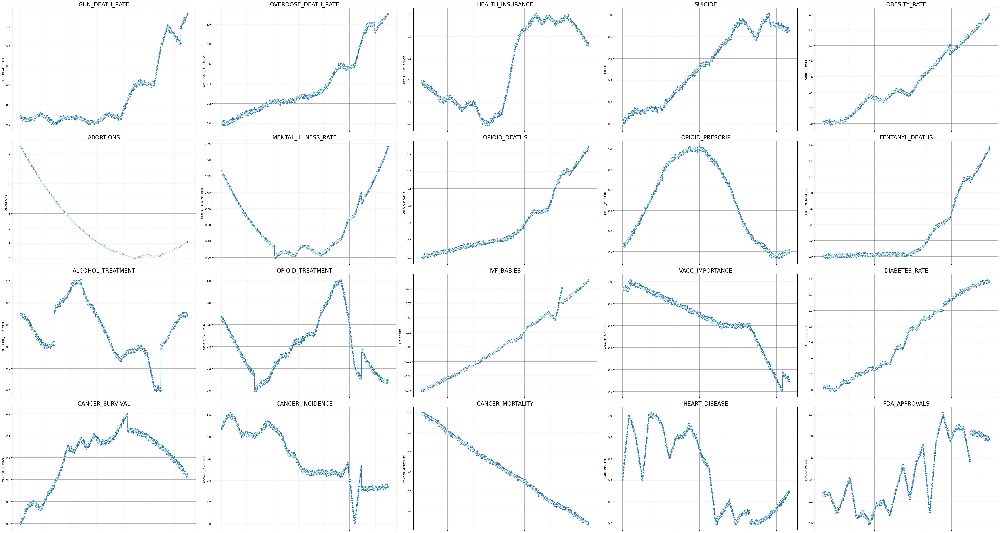

In [48]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 2*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

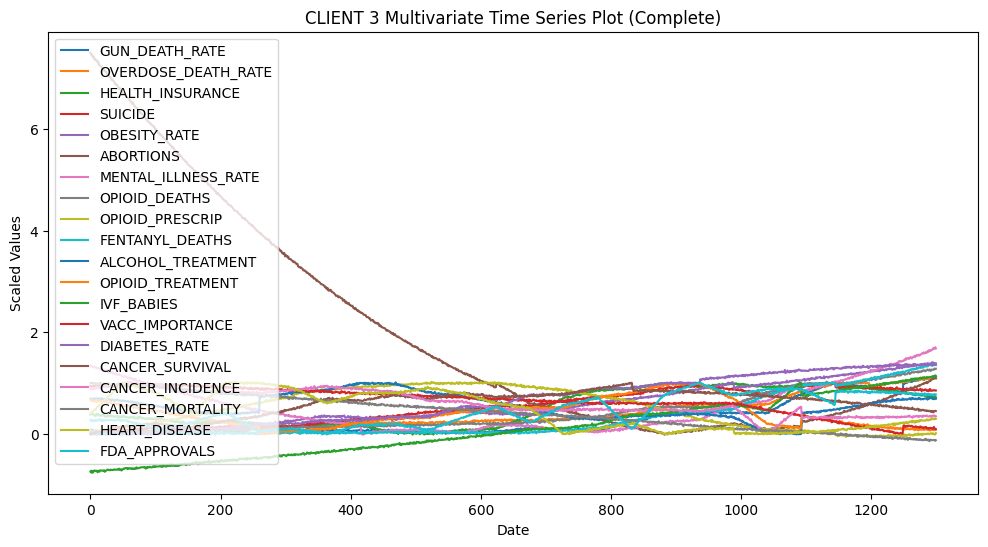

In [49]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in df_extrapolated.columns:
    plt.plot(df_extrapolated.index, df_extrapolated[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 3 Multivariate Time Series Plot (Complete)")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [50]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT3_Noisy_Extrapolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT3_Noisy_Extrapolated.xlsx


### CLIENT 4

In [ ]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT4_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   DARK_MONEY  VOTER_TURNOUT  SUPREME_COURT_APPROVAL  CLOTURE_MOTIONS  \
0    0.023149       0.705882                     NaN              NaN   
1    0.034879       0.701109                     NaN              NaN   
2    0.024606       0.677900                     NaN              NaN   
3    0.031582       0.684180                     NaN              NaN   
4    0.032320       0.649366                     NaN              NaN   

   ENACTED_LEGIS  OFFICIAL_THREATS  PARTISAN_GAP_HOUSE  PARTISAN_GAP_SENATE  \
0            NaN               NaN                 NaN                  NaN   
1            NaN               NaN                 NaN                  NaN   
2            NaN               NaN                 NaN                  NaN   
3            NaN               NaN                 NaN                  NaN   
4            NaN               NaN                 NaN                  NaN   

   HOUSE_LEANING  SENATE_LEANING  
0            NaN             NaN  
1            NaN

In [ ]:
# Apply the function to each column in your DataFrame
df_extrapolated = df.copy()

for col in df.columns:
    df_extrapolated[col] = extrapolate_column(df.index.values, df[col].values)

print(df_extrapolated)

      DARK_MONEY  VOTER_TURNOUT  SUPREME_COURT_APPROVAL  CLOTURE_MOTIONS  \
0       0.023149       0.705882                0.880868         0.025009   
1       0.034879       0.701109                0.888837         0.009958   
2       0.024606       0.677900                0.898276         0.006978   
3       0.031582       0.684180                0.887788        -0.002898   
4       0.032320       0.649366                0.889253         0.001380   
...          ...            ...                     ...              ...   
1295    0.042392       0.304440                0.225404         0.753365   
1296    0.056575       0.294347                0.222405         0.755617   
1297    0.033419       0.303321                0.231724         0.750935   
1298    0.036271       0.300771                0.222952         0.727209   
1299    0.021290       0.288433                0.226864         0.744526   

      ENACTED_LEGIS  OFFICIAL_THREATS  PARTISAN_GAP_HOUSE  \
0          0.428836       

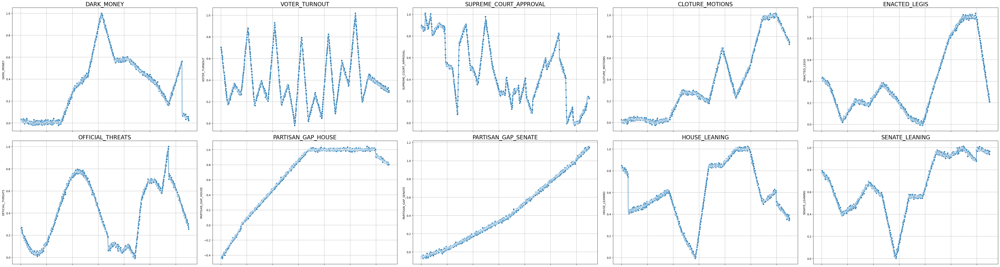

In [ ]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 4*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

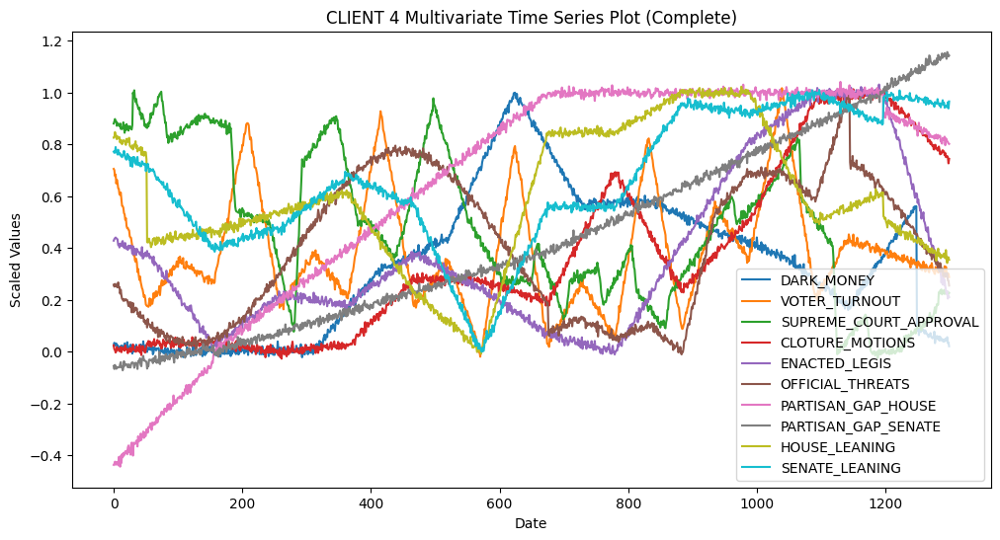

In [ ]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in df_extrapolated.columns:
    plt.plot(df_extrapolated.index, df_extrapolated[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 4 Multivariate Time Series Plot (Complete)")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [ ]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT4_Noisy_Extrapolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT4_Noisy_Extrapolated.xlsx


### CLIENT 5

In [ ]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT5_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df.head())

   PUBLIC_TUITION  PRIVATE_TUITION  COLLEGE_ENROLL  LOAN_DEBT  READING_PROF  \
0        0.000000         0.000000        0.000000        NaN      0.300000   
1       -0.006552         0.003497        0.003064        NaN      0.299539   
2        0.022798        -0.010235        0.026125        NaN      0.302126   
3        0.003382         0.005894        0.013857        NaN      0.304973   
4        0.008888        -0.001661        0.033394        NaN      0.312796   

   MATH_PROF  
0   0.000000  
1  -0.013301  
2   0.010318  
3   0.020458  
4   0.003800  


In [ ]:
# Apply the function to each column in your DataFrame
df_extrapolated = df.copy()

for col in df.columns:
    df_extrapolated[col] = extrapolate_column(df.index.values, df[col].values)

print(df_extrapolated)

      PUBLIC_TUITION  PRIVATE_TUITION  COLLEGE_ENROLL  LOAN_DEBT  \
0           0.000000         0.000000        0.000000  -0.159920   
1          -0.006552         0.003497        0.003064  -0.162159   
2           0.022798        -0.010235        0.026125  -0.168716   
3           0.003382         0.005894        0.013857  -0.166034   
4           0.008888        -0.001661        0.033394  -0.172260   
...              ...              ...             ...        ...   
1295        0.941522         1.094491        0.363984   1.006990   
1296        0.945133         1.126258        0.351478   1.018019   
1297        0.955071         1.124795        0.375492   0.998280   
1298        0.932058         1.101322        0.342678   1.016240   
1299        0.920160         1.129087        0.347753   1.000000   

      READING_PROF  MATH_PROF  
0         0.300000   0.000000  
1         0.299539  -0.013301  
2         0.302126   0.010318  
3         0.304973   0.020458  
4         0.312796   0.

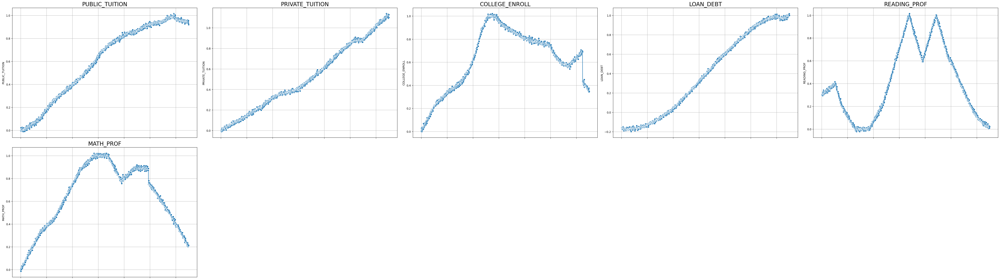

In [ ]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

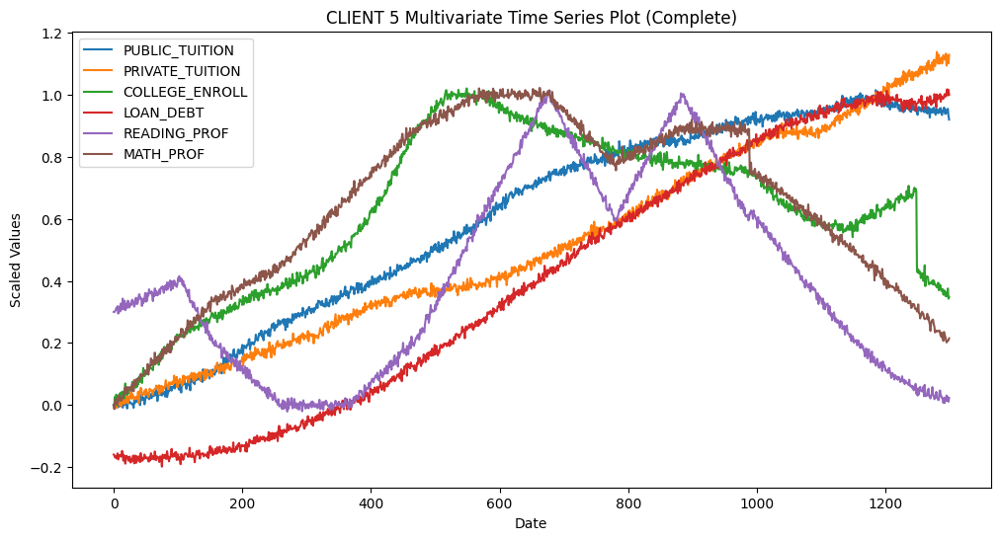

In [ ]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in df_extrapolated.columns:
    plt.plot(df_extrapolated.index, df_extrapolated[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 5 Multivariate Time Series Plot (Complete)")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [ ]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT5_Noisy_Extrapolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT5_Noisy_Extrapolated.xlsx


### CLIENT 6

In [51]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT6_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df)

      OIL_PROD  NATGAS_PROD  RENEW_PROD  PETROL_CONSUMP  NATGAS_CONSUMP  \
0     0.113300     0.037699    0.140244        0.684411        0.058927   
1     0.109691     0.042296    0.115733        0.686080        0.061647   
2     0.116058     0.051494    0.137692        0.701297        0.041437   
3     0.100838     0.040681    0.128553        0.706069        0.033212   
4     0.116816     0.040807    0.123539        0.686636        0.069543   
...        ...          ...         ...             ...             ...   
1244  0.992861     0.999025    1.015714        0.396472        0.996867   
1245  1.001568     1.016848    1.001193        0.384250        0.986242   
1246  1.011728     0.988659    1.008425        0.383288        0.988218   
1247  0.994765     1.010774    1.009411        0.401702        0.998675   
1248  1.000000     1.000000    1.000000        0.392902        1.000000   

      RENEW_CONSUMP  EMISSIONS  HYBRID_VEHICLES  ELECTRIC_VEHICLES  \
0          0.145877   0.90540

In [52]:
# Define the full index range
max_index = 1299  # Add extra observations since these could not load
full_index = pd.RangeIndex(start=0, stop=max_index+1)  # Ensure indices go up to 1299

# Reindex to add blank rows where needed
df = df.reindex(full_index)
print(df)

      OIL_PROD  NATGAS_PROD  RENEW_PROD  PETROL_CONSUMP  NATGAS_CONSUMP  \
0     0.113300     0.037699    0.140244        0.684411        0.058927   
1     0.109691     0.042296    0.115733        0.686080        0.061647   
2     0.116058     0.051494    0.137692        0.701297        0.041437   
3     0.100838     0.040681    0.128553        0.706069        0.033212   
4     0.116816     0.040807    0.123539        0.686636        0.069543   
...        ...          ...         ...             ...             ...   
1295       NaN          NaN         NaN             NaN             NaN   
1296       NaN          NaN         NaN             NaN             NaN   
1297       NaN          NaN         NaN             NaN             NaN   
1298       NaN          NaN         NaN             NaN             NaN   
1299       NaN          NaN         NaN             NaN             NaN   

      RENEW_CONSUMP  EMISSIONS  HYBRID_VEHICLES  ELECTRIC_VEHICLES  \
0          0.145877   0.90540

In [53]:
# Apply the function to each column in your DataFrame
df_extrapolated = df.copy()

for col in df.columns:
    df_extrapolated[col] = extrapolate_column(df.index.values, df[col].values)

print(df_extrapolated)

      OIL_PROD  NATGAS_PROD  RENEW_PROD  PETROL_CONSUMP  NATGAS_CONSUMP  \
0     0.113300     0.037699    0.140244        0.684411        0.058927   
1     0.109691     0.042296    0.115733        0.686080        0.061647   
2     0.116058     0.051494    0.137692        0.701297        0.041437   
3     0.100838     0.040681    0.128553        0.706069        0.033212   
4     0.116816     0.040807    0.123539        0.686636        0.069543   
...        ...          ...         ...             ...             ...   
1295  0.964965     1.068269    0.912642        0.598293        1.049680   
1296  0.934222     1.082532    0.912058        0.594775        1.036622   
1297  0.936338     1.068775    0.900083        0.586104        1.028795   
1298  0.945078     1.080035    0.904576        0.595841        1.029134   
1299  0.927699     1.071796    0.905887        0.607125        1.039005   

      RENEW_CONSUMP  EMISSIONS  HYBRID_VEHICLES  ELECTRIC_VEHICLES  \
0          0.145877   0.90540

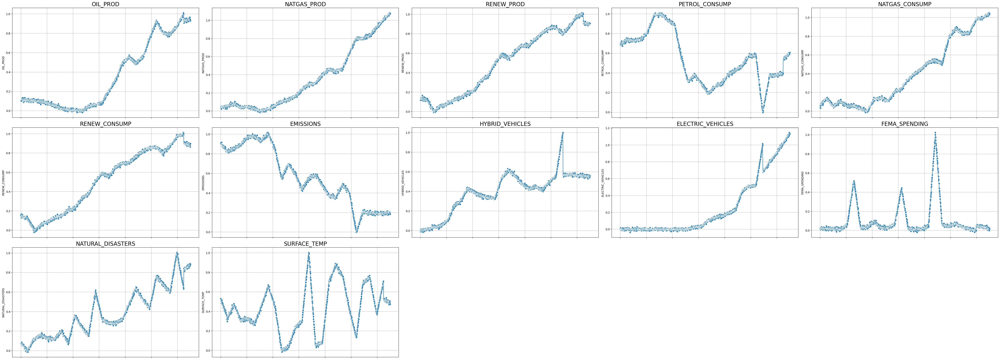

In [54]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 3*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

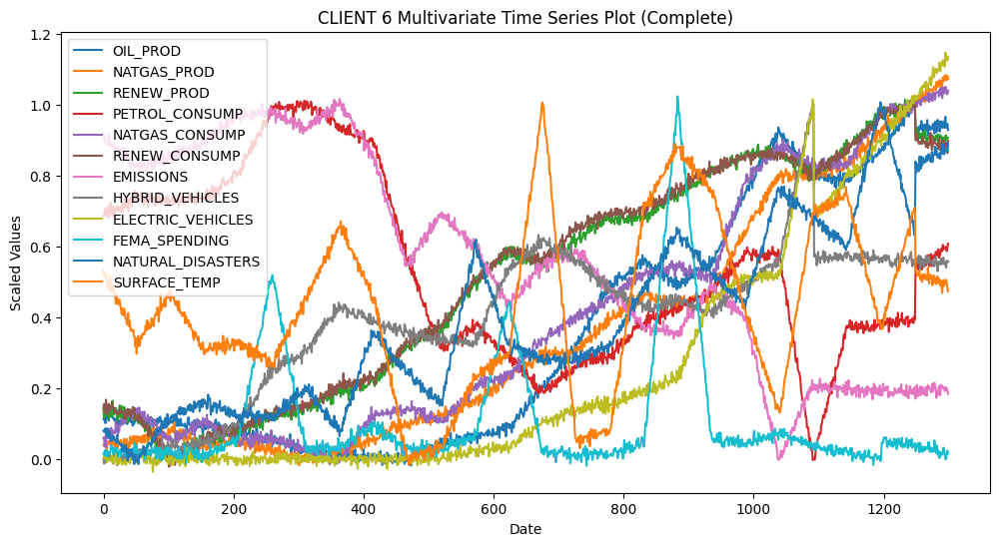

In [55]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in df_extrapolated.columns:
    plt.plot(df_extrapolated.index, df_extrapolated[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 6 Multivariate Time Series Plot (Complete)")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [56]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT6_Noisy_Extrapolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT6_Noisy_Extrapolated.xlsx


### CLIENT 7

In [57]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT7_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df)

      BORDER_ENCOUNTERS  IMMIGRANT_POP  UNDOCUMENTED_POP  BORDER_SPENDING  \
0                   NaN       0.000000          0.000000         0.005805   
1                   NaN       0.020830         -0.010088         0.017746   
2                   NaN      -0.010507          0.023193         0.024890   
3                   NaN       0.013128          0.006863         0.015608   
4                   NaN      -0.011326          0.021793         0.003084   
...                 ...            ...               ...              ...   
1287                NaN            NaN               NaN              NaN   
1288                NaN            NaN               NaN              NaN   
1289                NaN            NaN               NaN              NaN   
1290                NaN            NaN               NaN              NaN   
1291                NaN            NaN               NaN              NaN   

      DEPORTATIONS  ASYLUM_APPS  
0              NaN          NaN  
1      

In [58]:
# Define the full index range
max_index = 1299  # Add extra observations since these could not load
full_index = pd.RangeIndex(start=0, stop=max_index+1)  # Ensure indices go up to 1299

# Reindex to add blank rows where needed
df = df.reindex(full_index)
print(df)

      BORDER_ENCOUNTERS  IMMIGRANT_POP  UNDOCUMENTED_POP  BORDER_SPENDING  \
0                   NaN       0.000000          0.000000         0.005805   
1                   NaN       0.020830         -0.010088         0.017746   
2                   NaN      -0.010507          0.023193         0.024890   
3                   NaN       0.013128          0.006863         0.015608   
4                   NaN      -0.011326          0.021793         0.003084   
...                 ...            ...               ...              ...   
1295                NaN            NaN               NaN              NaN   
1296                NaN            NaN               NaN              NaN   
1297                NaN            NaN               NaN              NaN   
1298                NaN            NaN               NaN              NaN   
1299                NaN            NaN               NaN              NaN   

      DEPORTATIONS  ASYLUM_APPS  
0              NaN          NaN  
1      

In [59]:
# Apply the function to each column in your DataFrame
df_extrapolated = df.copy()

for col in df.columns:
    df_extrapolated[col] = extrapolate_column(df.index.values, df[col].values)

print(df_extrapolated)

      BORDER_ENCOUNTERS  IMMIGRANT_POP  UNDOCUMENTED_POP  BORDER_SPENDING  \
0              0.348990       0.000000          0.000000         0.005805   
1              0.364778       0.020830         -0.010088         0.017746   
2              0.347291      -0.010507          0.023193         0.024890   
3              0.355485       0.013128          0.006863         0.015608   
4              0.354929      -0.011326          0.021793         0.003084   
...                 ...            ...               ...              ...   
1295           0.416711       1.005783          0.063269         0.802004   
1296           0.442415       1.021378          0.068892         0.785361   
1297           0.419932       1.035884          0.072148         0.804150   
1298           0.428239       1.025400          0.067862         0.815602   
1299           0.425490       1.022823          0.065323         0.804976   

      DEPORTATIONS  ASYLUM_APPS  
0         0.140767    -3.974003  
1      

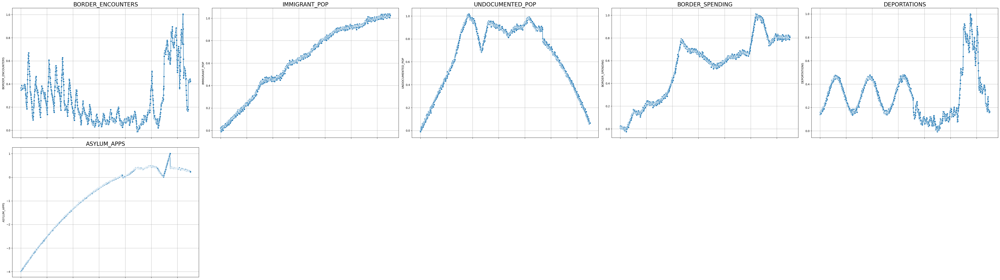

In [60]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 7*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

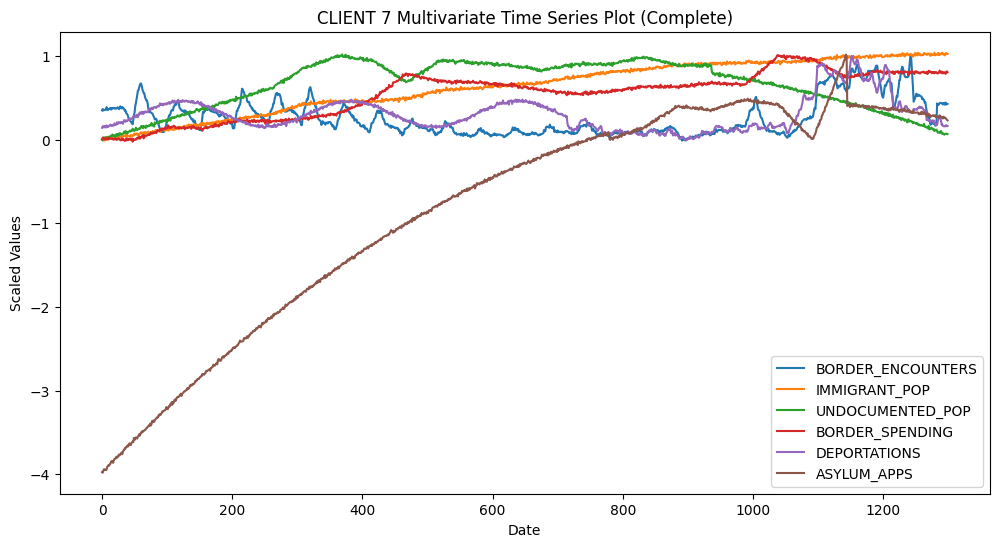

In [61]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in df_extrapolated.columns:
    plt.plot(df_extrapolated.index, df_extrapolated[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 7 Multivariate Time Series Plot (Complete)")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [62]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT7_Noisy_Extrapolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT7_Noisy_Extrapolated.xlsx


### CLIENT 8

In [8]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT8_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df)

      LGBTQ_IDENTITY  HOMELESS_POP  FERTILITY_RATE  USA_POPULATION  WHITE_POP  \
0                NaN           NaN        0.770270        0.000000   1.000000   
1                NaN           NaN        0.778413        0.031238   0.998858   
2                NaN           NaN        0.770321        0.005266   0.994424   
3                NaN           NaN        0.772128        0.000037   1.003671   
4                NaN           NaN        0.773978       -0.001780   0.983453   
...              ...           ...             ...             ...        ...   
1192        0.994943      0.975166        0.020697             NaN   0.008408   
1193        1.005191      0.971021       -0.004332             NaN   0.002941   
1194        1.004696      0.982159       -0.002717             NaN  -0.012402   
1195        1.006586      1.003497       -0.006013             NaN  -0.002467   
1196        1.000000      1.000000        0.000000             NaN   0.000000   

      HISPANIC_POP  BLACK_P

In [9]:
# Define the full index range
max_index = 1299  # Add extra observations since these could not load
full_index = pd.RangeIndex(start=0, stop=max_index+1)  # Ensure indices go up to 1299

# Reindex to add blank rows where needed
df = df.reindex(full_index)
print(df)

      LGBTQ_IDENTITY  HOMELESS_POP  FERTILITY_RATE  USA_POPULATION  WHITE_POP  \
0                NaN           NaN        0.770270        0.000000   1.000000   
1                NaN           NaN        0.778413        0.031238   0.998858   
2                NaN           NaN        0.770321        0.005266   0.994424   
3                NaN           NaN        0.772128        0.000037   1.003671   
4                NaN           NaN        0.773978       -0.001780   0.983453   
...              ...           ...             ...             ...        ...   
1295             NaN           NaN             NaN             NaN        NaN   
1296             NaN           NaN             NaN             NaN        NaN   
1297             NaN           NaN             NaN             NaN        NaN   
1298             NaN           NaN             NaN             NaN        NaN   
1299             NaN           NaN             NaN             NaN        NaN   

      HISPANIC_POP  BLACK_P

In [12]:
# Apply the function to each column in your DataFrame
df_extrapolated = df.copy()

for col in df.columns:
    df_extrapolated[col] = extrapolate_column(df.index.values, df[col].values)

print(df_extrapolated)

      LGBTQ_IDENTITY  HOMELESS_POP  FERTILITY_RATE  USA_POPULATION  WHITE_POP  \
0           1.471264      0.017673        0.770270        0.000000   1.000000   
1           1.456349      0.019149        0.778413        0.031238   0.998858   
2           1.468609      0.025027        0.770321        0.005266   0.994424   
3           1.429767      0.027865        0.772128        0.000037   1.003671   
4           1.455641      0.016515        0.773978       -0.001780   0.983453   
...              ...           ...             ...             ...        ...   
1295        1.402275      0.858402       -0.005293        1.060927  -0.051544   
1296        1.408173      0.853768       -0.010347        1.042357  -0.040923   
1297        1.414523      0.860059        0.006720        1.062667  -0.026822   
1298        1.401229      0.856402       -0.011248        1.038596  -0.039800   
1299        1.396585      0.843472       -0.004581        1.057357  -0.040847   

      HISPANIC_POP  BLACK_P

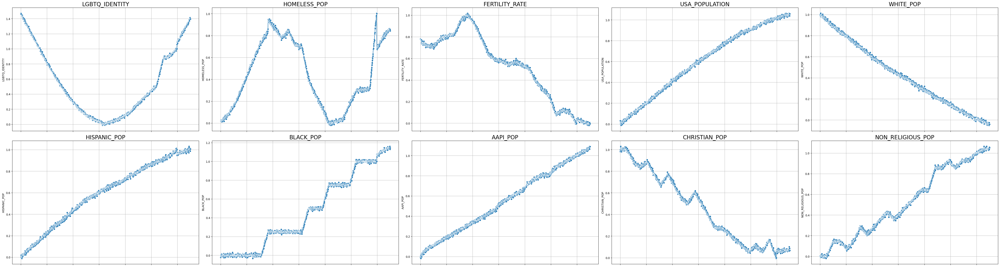

In [15]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 4*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

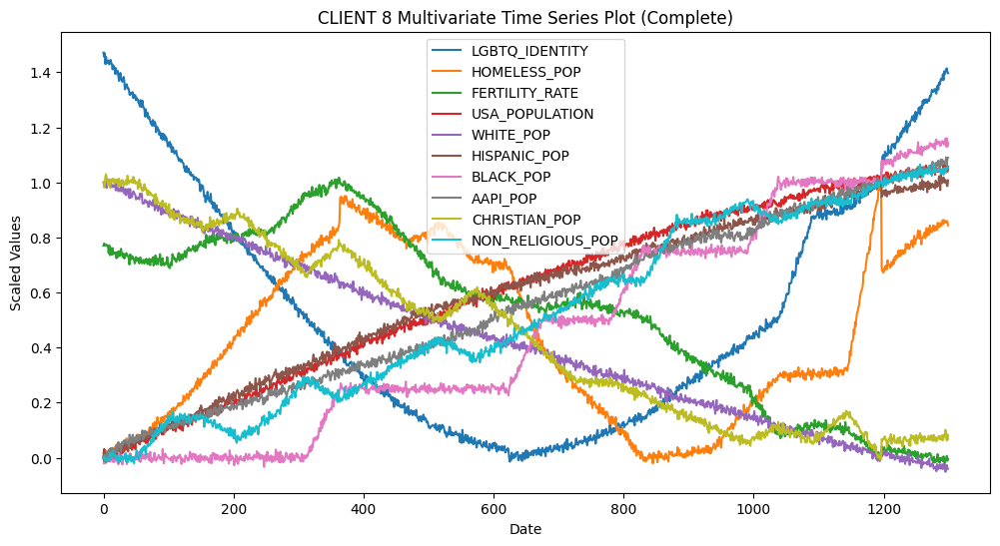

In [16]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in df_extrapolated.columns:
    plt.plot(df_extrapolated.index, df_extrapolated[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 8 Multivariate Time Series Plot (Complete)")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [17]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT8_Noisy_Extrapolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT8_Noisy_Extrapolated.xlsx


### CLIENT 9

In [19]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT9_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df)

      FOREIGN_AID  MIL_APPLICANTS  GLOBAL_INVOLVE_OPINION  MIL_DEATHS
0        0.060345        0.911036                     NaN    0.093671
1        0.062225        0.926419                     NaN    0.105302
2        0.050006        0.891081                     NaN    0.117353
3        0.048159        0.905652                     NaN    0.110694
4        0.062155        0.918956                     NaN    0.110966
...           ...             ...                     ...         ...
1192          NaN             NaN               -0.004197         NaN
1193          NaN             NaN                0.003767         NaN
1194          NaN             NaN                0.007077         NaN
1195          NaN             NaN                0.000632         NaN
1196          NaN             NaN                0.000000         NaN

[1197 rows x 4 columns]


In [20]:
# Define the full index range
max_index = 1299  # Add extra observations since these could not load
full_index = pd.RangeIndex(start=0, stop=max_index+1)  # Ensure indices go up to 1299

# Reindex to add blank rows where needed
df = df.reindex(full_index)
print(df)

      FOREIGN_AID  MIL_APPLICANTS  GLOBAL_INVOLVE_OPINION  MIL_DEATHS
0        0.060345        0.911036                     NaN    0.093671
1        0.062225        0.926419                     NaN    0.105302
2        0.050006        0.891081                     NaN    0.117353
3        0.048159        0.905652                     NaN    0.110694
4        0.062155        0.918956                     NaN    0.110966
...           ...             ...                     ...         ...
1295          NaN             NaN                     NaN         NaN
1296          NaN             NaN                     NaN         NaN
1297          NaN             NaN                     NaN         NaN
1298          NaN             NaN                     NaN         NaN
1299          NaN             NaN                     NaN         NaN

[1300 rows x 4 columns]


In [21]:
# Apply the function to each column in your DataFrame
df_extrapolated = df.copy()

for col in df.columns:
    df_extrapolated[col] = extrapolate_column(df.index.values, df[col].values)

print(df_extrapolated)

      FOREIGN_AID  MIL_APPLICANTS  GLOBAL_INVOLVE_OPINION  MIL_DEATHS
0        0.060345        0.911036                0.817566    0.093671
1        0.062225        0.926419                0.829072    0.105302
2        0.050006        0.891081                0.835935    0.117353
3        0.048159        0.905652                0.833110    0.110694
4        0.062155        0.918956                0.824281    0.110966
...           ...             ...                     ...         ...
1295     0.872326        0.251784                0.068828    0.839810
1296     0.868319        0.270651                0.055416    0.842661
1297     0.861356        0.251552                0.077939    0.841696
1298     0.865518        0.257493                0.075596    0.850052
1299     0.870818        0.259115                0.077578    0.838175

[1300 rows x 4 columns]


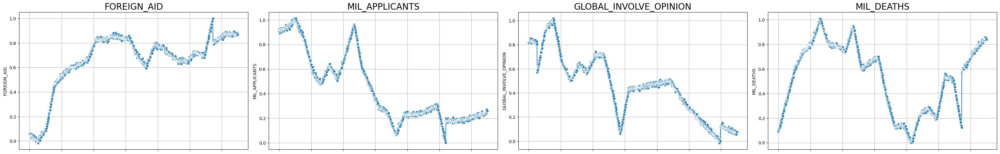

In [22]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(40, 7*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

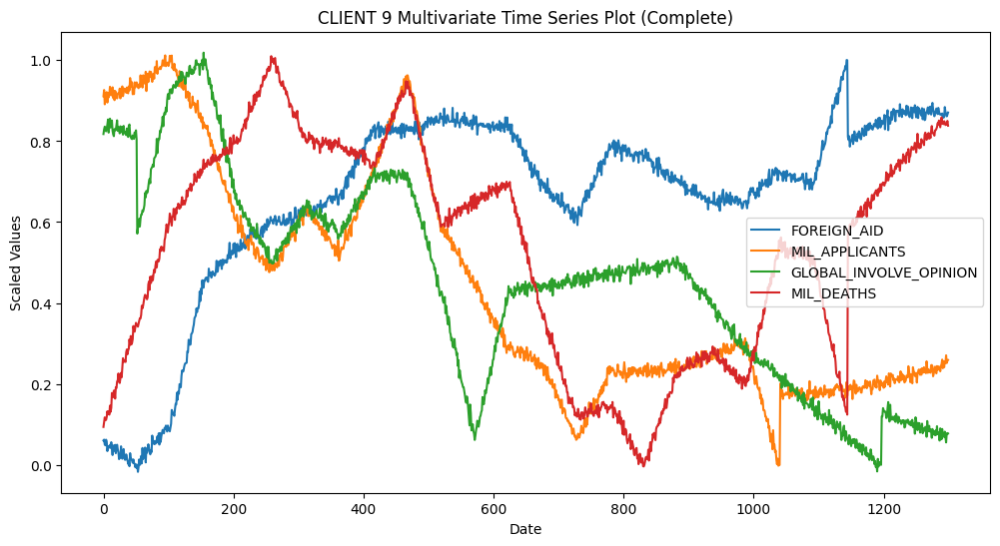

In [23]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in df_extrapolated.columns:
    plt.plot(df_extrapolated.index, df_extrapolated[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 9 Multivariate Time Series Plot (Complete)")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [24]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT9_Noisy_Extrapolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT9_Noisy_Extrapolated.xlsx


### CLIENT 10

In [25]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT10_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df)

      GOOD_BRIDGES  UNSATIS_ROADS
0              NaN       0.254054
1              NaN       0.265454
2              NaN       0.264960
3              NaN       0.244200
4              NaN       0.259243
...            ...            ...
1192      0.008792            NaN
1193      0.001074            NaN
1194     -0.014145            NaN
1195     -0.023038            NaN
1196      0.000000            NaN

[1197 rows x 2 columns]


In [26]:
# Define the full index range
max_index = 1299  # Add extra observations since these could not load
full_index = pd.RangeIndex(start=0, stop=max_index+1)  # Ensure indices go up to 1299

# Reindex to add blank rows where needed
df = df.reindex(full_index)
print(df)

      GOOD_BRIDGES  UNSATIS_ROADS
0              NaN       0.254054
1              NaN       0.265454
2              NaN       0.264960
3              NaN       0.244200
4              NaN       0.259243
...            ...            ...
1295           NaN            NaN
1296           NaN            NaN
1297           NaN            NaN
1298           NaN            NaN
1299           NaN            NaN

[1300 rows x 2 columns]


In [27]:
# Apply the function to each column in your DataFrame
df_extrapolated = df.copy()

for col in df.columns:
    df_extrapolated[col] = extrapolate_column(df.index.values, df[col].values)

print(df_extrapolated)

      GOOD_BRIDGES  UNSATIS_ROADS
0         0.772665       0.254054
1         0.752054       0.265454
2         0.753207       0.264960
3         0.760456       0.244200
4         0.774136       0.259243
...            ...            ...
1295      0.225596       0.091789
1296      0.230364       0.080081
1297      0.208144       0.084131
1298      0.234504       0.064336
1299      0.234909       0.088643

[1300 rows x 2 columns]


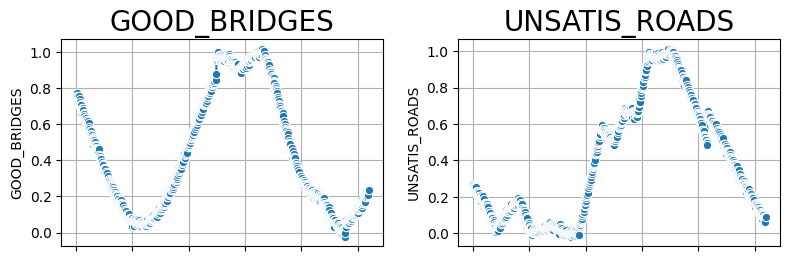

In [28]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(20, 7*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

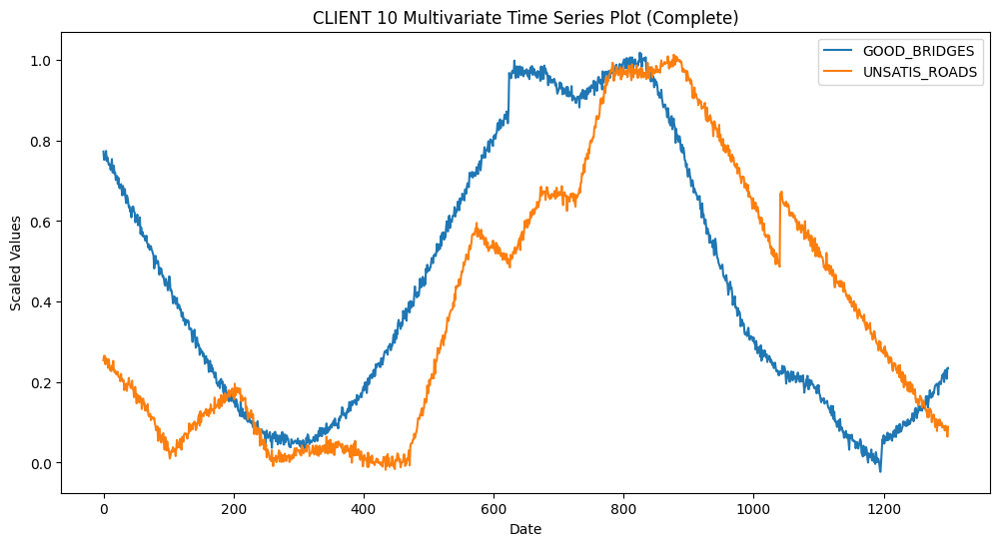

In [29]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in df_extrapolated.columns:
    plt.plot(df_extrapolated.index, df_extrapolated[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 10 Multivariate Time Series Plot (Complete)")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [30]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT10_Noisy_Extrapolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT10_Noisy_Extrapolated.xlsx


### CLIENT 11

In [32]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT11_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df)

      ACTIVE_SHOOTERS  BACKGROUND_CHECKS  FIREARM_PROD  DOM_VIOLENCE_RATE  \
0            0.000000           0.002840      0.100515                NaN   
1            0.017108          -0.000396      0.118051                NaN   
2            0.013403           0.009597      0.089879                NaN   
3            0.019513           0.005860      0.099558                NaN   
4            0.011888          -0.005381      0.104733                NaN   
...               ...                ...           ...                ...   
1192              NaN                NaN           NaN                NaN   
1193              NaN                NaN           NaN                NaN   
1194              NaN                NaN           NaN                NaN   
1195              NaN                NaN           NaN                NaN   
1196              NaN                NaN           NaN                NaN   

      INCARCERATED_POP  HOMICIDE_RATE  DOM_TERROR_INCIDENTS  \
0           

In [33]:
# Define the full index range
max_index = 1299  # Add extra observations since these could not load
full_index = pd.RangeIndex(start=0, stop=max_index+1)  # Ensure indices go up to 1299

# Reindex to add blank rows where needed
df = df.reindex(full_index)
print(df)

      ACTIVE_SHOOTERS  BACKGROUND_CHECKS  FIREARM_PROD  DOM_VIOLENCE_RATE  \
0            0.000000           0.002840      0.100515                NaN   
1            0.017108          -0.000396      0.118051                NaN   
2            0.013403           0.009597      0.089879                NaN   
3            0.019513           0.005860      0.099558                NaN   
4            0.011888          -0.005381      0.104733                NaN   
...               ...                ...           ...                ...   
1295              NaN                NaN           NaN                NaN   
1296              NaN                NaN           NaN                NaN   
1297              NaN                NaN           NaN                NaN   
1298              NaN                NaN           NaN                NaN   
1299              NaN                NaN           NaN                NaN   

      INCARCERATED_POP  HOMICIDE_RATE  DOM_TERROR_INCIDENTS  \
0           

In [34]:
# Apply the function to each column in your DataFrame
df_extrapolated = df.copy()

for col in df.columns:
    df_extrapolated[col] = extrapolate_column(df.index.values, df[col].values)

print(df_extrapolated)

      ACTIVE_SHOOTERS  BACKGROUND_CHECKS  FIREARM_PROD  DOM_VIOLENCE_RATE  \
0            0.000000           0.002840      0.100515           0.227447   
1            0.017108          -0.000396      0.118051           0.220432   
2            0.013403           0.009597      0.089879           0.225243   
3            0.019513           0.005860      0.099558           0.220363   
4            0.011888          -0.005381      0.104733           0.241619   
...               ...                ...           ...                ...   
1295         1.172879           1.313311      0.038567           0.263296   
1296         1.168534           1.318800      0.039928           0.265976   
1297         1.167314           1.328613      0.033939           0.268526   
1298         1.187455           1.321816      0.027208           0.281842   
1299         1.169218           1.318254      0.039095           0.282792   

      INCARCERATED_POP  HOMICIDE_RATE  DOM_TERROR_INCIDENTS  \
0           

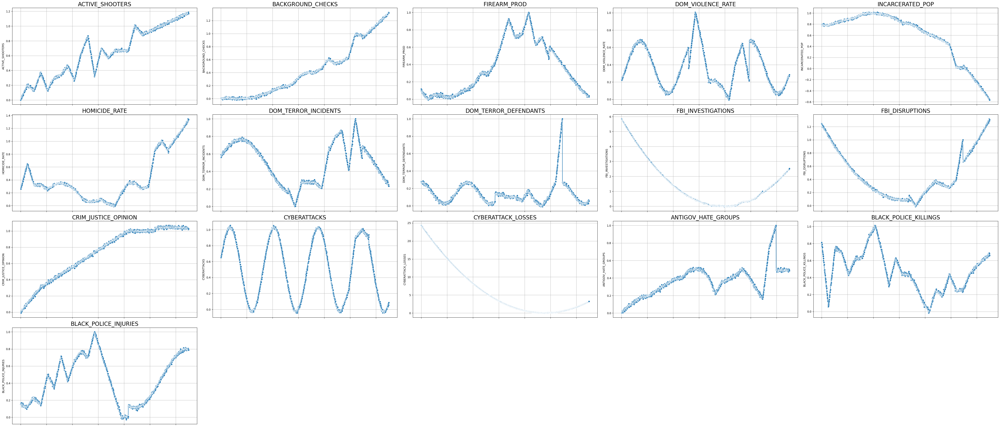

In [35]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(50, 2*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

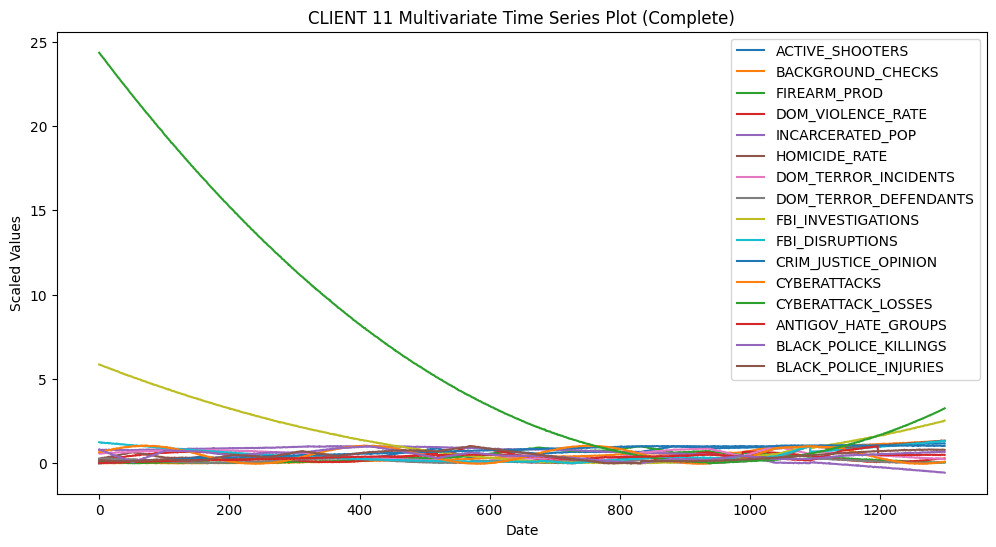

In [36]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in df_extrapolated.columns:
    plt.plot(df_extrapolated.index, df_extrapolated[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 11 Multivariate Time Series Plot (Complete)")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [37]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT11_Noisy_Extrapolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT11_Noisy_Extrapolated.xlsx


### CLIENT 12

In [38]:
# Load the file from Google Drive
file_path = '/content/drive/My Drive/G720_CLIENT12_Noisy_Interpolated.xlsx'

# Load specified sheet
df = pd.read_excel(file_path, engine='openpyxl')

# Display the first few rows
print(df)

      AGRI_SPENDING     FARMS  AGRI_SALES
0          1.000000  0.747482    0.033151
1          1.009763  0.755527    0.012815
2          0.973442  0.746970    0.045595
3          0.985362  0.749999    0.035259
4          0.963912  0.731088    0.031125
...             ...       ...         ...
1140            NaN       NaN    0.981860
1141            NaN       NaN    0.994557
1142            NaN       NaN    1.006720
1143            NaN       NaN    1.011718
1144            NaN       NaN    1.000000

[1145 rows x 3 columns]


In [39]:
# Define the full index range
max_index = 1299  # Add extra observations since these could not load
full_index = pd.RangeIndex(start=0, stop=max_index+1)  # Ensure indices go up to 1299

# Reindex to add blank rows where needed
df = df.reindex(full_index)
print(df)

      AGRI_SPENDING     FARMS  AGRI_SALES
0          1.000000  0.747482    0.033151
1          1.009763  0.755527    0.012815
2          0.973442  0.746970    0.045595
3          0.985362  0.749999    0.035259
4          0.963912  0.731088    0.031125
...             ...       ...         ...
1295            NaN       NaN         NaN
1296            NaN       NaN         NaN
1297            NaN       NaN         NaN
1298            NaN       NaN         NaN
1299            NaN       NaN         NaN

[1300 rows x 3 columns]


In [40]:
# Apply the function to each column in your DataFrame
df_extrapolated = df.copy()

for col in df.columns:
    df_extrapolated[col] = extrapolate_column(df.index.values, df[col].values)

print(df_extrapolated)

      AGRI_SPENDING     FARMS  AGRI_SALES
0          1.000000  0.747482    0.033151
1          1.009763  0.755527    0.012815
2          0.973442  0.746970    0.045595
3          0.985362  0.749999    0.035259
4          0.963912  0.731088    0.031125
...             ...       ...         ...
1295       0.518754  0.482968    0.284282
1296       0.509532  0.472014    0.280977
1297       0.511735  0.480155    0.284237
1298       0.511684  0.471341    0.290775
1299       0.521794  0.478389    0.259838

[1300 rows x 3 columns]


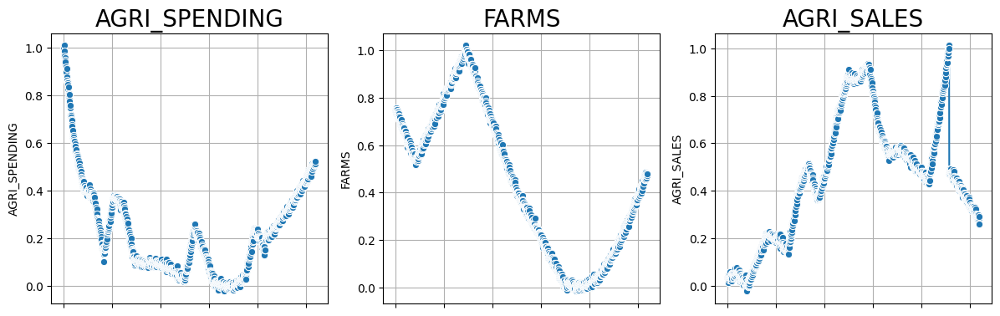

In [41]:
# Plot each variable in a mini-plot
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(20, 7*len(df_extrapolated.columns)), sharex=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

for i, col in enumerate(df_extrapolated.columns):
    sns.lineplot(data=df_extrapolated, x=df_extrapolated.index, y=col, ax=axes[i], marker='o')
    axes[i].set_title(f"{col}", fontsize=20)
    axes[i].set_ylabel(col)
    axes[i].grid(True)

# Hide any unused subplots (if num_vars is not a multiple of 5)
for i in range(len(df_extrapolated.columns), len(axes)):
    fig.delaxes(axes[i])

plt.xlabel("DATE")
plt.tight_layout()
plt.show()

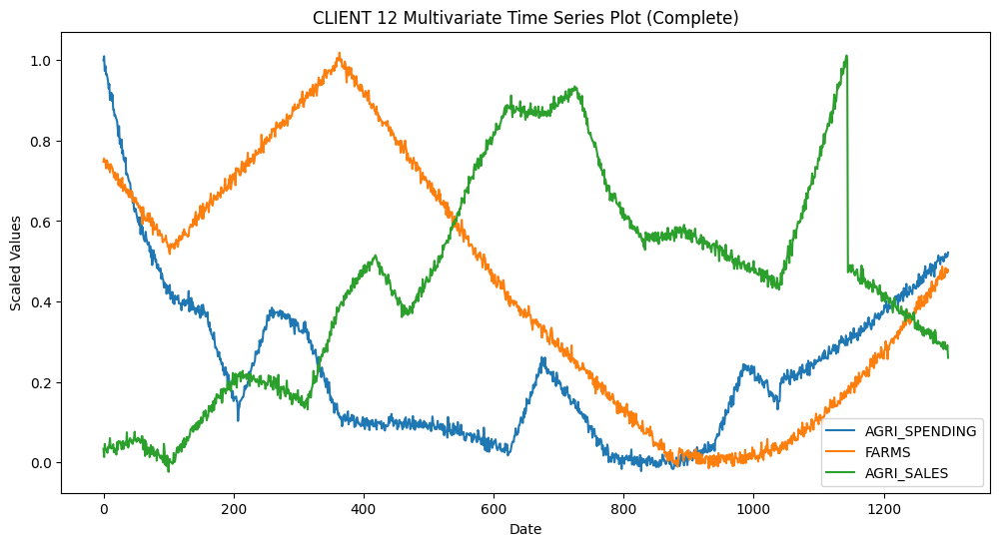

In [42]:
# Set figure size
plt.figure(figsize=(12, 6))

# Plot each column with a unique color
for column in df_extrapolated.columns:
    plt.plot(df_extrapolated.index, df_extrapolated[column], label=column)

# Add labels and title
plt.xlabel("Date")
plt.ylabel("Scaled Values")
plt.title("CLIENT 12 Multivariate Time Series Plot (Complete)")

# Add legend to identify each line
plt.legend()

# Show the plot
plt.show()

In [43]:
# Define the output file path
output_file = "/content/drive/My Drive/G720_CLIENT12_Noisy_Extrapolated.xlsx"

# Save DataFrame to Excel
df_extrapolated.to_excel(output_file, index=False, engine='openpyxl')

print(f"Data successfully saved to {output_file}")

Data successfully saved to /content/drive/My Drive/G720_CLIENT12_Noisy_Extrapolated.xlsx


In [44]:
# End of code 3/6/25
# Edited 4/2/25 to fix missing values